In [1]:
!pip install 'zarr<3'
!pip install timm


Defaulting to user installation because normal site-packages is not writeable
  Using cached zarr-2.18.7-py3-none-any.whl.metadata (5.8 kB)
  Using cached asciitree-0.3.3-py3-none-any.whl
  Using cached fasteners-0.20-py3-none-any.whl.metadata (4.8 kB)
  Using cached numcodecs-0.15.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (2.9 kB)
  Using cached deprecated-1.3.1-py2.py3-none-any.whl.metadata (5.9 kB)
Using cached zarr-2.18.7-py3-none-any.whl (211 kB)
Using cached numcodecs-0.15.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (8.9 MB)
Using cached fasteners-0.20-py3-none-any.whl (18 kB)
Using cached deprecated-1.3.1-py2.py3-none-any.whl (11 kB)

[notice] A new release of pip is available: 23.3.1 -> 25.3
[notice] To update, run: pip install --upgrade pip
Defaulting to user installation because normal site-packages is not writeable
  Using cached timm-1.0.22-py3-none-any.whl.metadata (63 kB)
Using cached timm-1.0.22-py3-none-any.whl (2.5 MB)

[not

In [1]:
# ALWAYS RUN THIS FIRST!
import os
import sys
from pathlib import Path

NOTEBOOK_DIR = Path("/rsrch9/home/plm/idso_fa1_pathology/codes/yshokrollahi/vitamin-p-latest")
os.chdir(NOTEBOOK_DIR)
sys.path.insert(0, str(NOTEBOOK_DIR))

print(f"✅ Working directory: {os.getcwd()}")

✅ Working directory: /rsrch9/home/plm/idso_fa1_pathology/codes/yshokrollahi/vitamin-p-latest


## Data Loading

In [2]:
# Cell 3: Import and create dataloaders
from dataset import Config, create_dataloaders

# Just use the correct relative path from your working directory
config = Config("configs/config_fold6.yaml")  # Note: "configs" not "config"
config.print_config()

train_loader, val_loader, test_loader = create_dataloaders(config)
print("\n✅ Ready to use!")

✅ CRC Dataset Package v1.0.0 loaded
CRC DATASET CONFIGURATION
Config File: configs/config_fold6.yaml
Zarr Base: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC/zarr_data
Cache: ./cache/multimodal_dataset_cache_gan.pkl
Strategy: memory

📊 Data Splits:
  Train: 45 samples
  Val: 5 samples
  Test: 0 samples

🔄 DataLoader:
  Batch Size: 8
  Num Workers: 0
  Pin Memory: True

🎨 Augmentation:
  Training: False
  Probability: 0.0

🎯 HV Maps:
  Generate: False
  Method: pannuke
  HE Nuclei: False
  HE Cells: False
  MIF Nuclei: False
  MIF Cells: False

🔍 Filtering:
  Min Instances: 0
  Filter Empty: False

CREATING DATALOADERS
Strategy: memory
Use Cache: True
Batch Size: 8
Num Workers: 0

Train split: 37 CRC + 8 Xenium samples
Val split: 4 CRC + 1 Xenium samples
Test split: 0 CRC + 0 Xenium samples

📦 Loading from cache: ./cache/combined_cache_train_5e7b3190.pkl
📦 Loaded 4760 patches from cache
📦 Loading from cache: ./cache/combined_cache_val_4feee610.pkl
📦 Loaded 486 patch

## Model

In [4]:
import torch
# Cell 1: Import GAN trainer
from vitaminp.gan import Pix2PixTrainer

# Cell 2: Initialize trainer
device = 'cuda' if torch.cuda.is_available() else 'cpu'

trainer = Pix2PixTrainer(
    train_loader=train_loader,
    val_loader=val_loader,
    device=device,
    lr_g=2e-4,
    lr_d=2e-4,
    lambda_l1=100,
    use_wandb=False,
    project_name="vitamin-p-gan",
    run_name="Pix2Pix-HE2MIF-notebook",
    checkpoint_dir="checkpoints"
)

# Cell 3: Train
trainer.train(epochs=250)

print("\n✅ GAN training complete!")
print("Model saved in: checkpoints/pix2pix_he_to_mif_best.pth")

                     PIX2PIX TRAINING: H&E → SYNTHETIC MIF                      
Generator params: 54,411,906
Discriminator params: 2,768,576
Device: cuda
Epochs: 250 | LR: 2e-4 | Lambda L1: 100


Training:   1%|▎                                                  | 4/595 [00:03<08:06,  1.21it/s, G_loss=52.8938, D_loss=0.7078, L1=0.5225]


KeyboardInterrupt: 

## Predictions

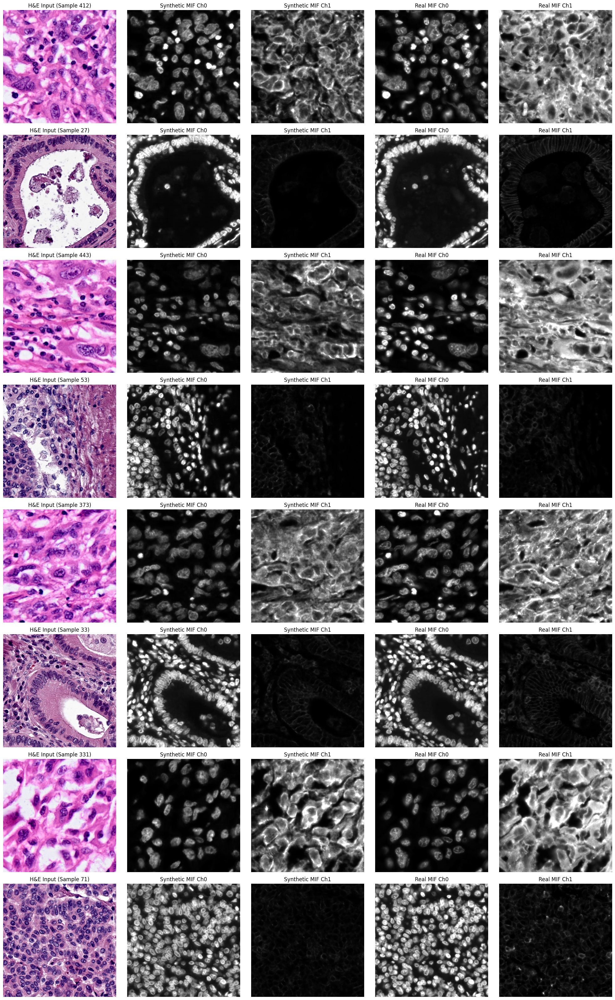

Showing 8 random samples from indices: [412, 27, 443, 53, 373, 33, 331, 71]


In [11]:
# Cell 1: Load trained GAN model
import torch
import matplotlib.pyplot as plt
import numpy as np
import random

from vitaminp.gan import Pix2PixGenerator
from vitaminp.gan.utils import GANPreprocessing

# Load generator
device = 'cuda' if torch.cuda.is_available() else 'cpu'
generator = Pix2PixGenerator(in_channels=3, out_channels=2).to(device)

# Load checkpoint
checkpoint = torch.load('checkpoints/pix2pix_he_to_mif_final.pth', map_location=device)
generator.load_state_dict(checkpoint['generator_state_dict'])
generator.eval()

preprocessor = GANPreprocessing()

# Cell 2: Visualize results with random sampling
@torch.no_grad()
def visualize_gan_results(val_loader, generator, preprocessor, device, num_samples=8):
    """Visualize H&E → Synthetic MIF → Real MIF with random sampling"""
    
    # Collect all validation samples
    all_he = []
    all_mif = []
    
    for batch in val_loader:
        all_he.append(batch['he_image'])
        all_mif.append(batch['mif_image'])
    
    all_he = torch.cat(all_he, dim=0)
    all_mif = torch.cat(all_mif, dim=0)
    
    # Randomly sample indices
    total_samples = all_he.shape[0]
    random_indices = random.sample(range(total_samples), min(num_samples, total_samples))
    
    he_img = all_he[random_indices].to(device)
    real_mif = all_mif[random_indices].to(device)
    
    # Preprocess
    he_norm = preprocessor.percentile_normalize(he_img)
    real_mif_norm = preprocessor.percentile_normalize(real_mif)
    
    # Generate synthetic MIF
    he_gan_input = preprocessor.to_gan_range(he_norm)
    fake_mif = generator(he_gan_input)
    fake_mif_01 = preprocessor.from_gan_range(fake_mif)
    
    # Move to CPU for plotting
    he_norm = he_norm.cpu().numpy()
    real_mif_norm = real_mif_norm.cpu().numpy()
    fake_mif_01 = fake_mif_01.cpu().numpy()
    
    # Plot
    fig, axes = plt.subplots(num_samples, 5, figsize=(20, 4*num_samples))
    
    for i in range(num_samples):
        # H&E RGB
        axes[i, 0].imshow(np.transpose(he_norm[i], (1, 2, 0)))
        axes[i, 0].set_title(f'H&E Input (Sample {random_indices[i]})')
        axes[i, 0].axis('off')
        
        # Synthetic MIF channel 0
        axes[i, 1].imshow(fake_mif_01[i, 0], cmap='gray', vmin=0, vmax=1)
        axes[i, 1].set_title('Synthetic MIF Ch0')
        axes[i, 1].axis('off')
        
        # Synthetic MIF channel 1
        axes[i, 2].imshow(fake_mif_01[i, 1], cmap='gray', vmin=0, vmax=1)
        axes[i, 2].set_title('Synthetic MIF Ch1')
        axes[i, 2].axis('off')
        
        # Real MIF channel 0
        axes[i, 3].imshow(real_mif_norm[i, 0], cmap='gray', vmin=0, vmax=1)
        axes[i, 3].set_title('Real MIF Ch0')
        axes[i, 3].axis('off')
        
        # Real MIF channel 1
        axes[i, 4].imshow(real_mif_norm[i, 1], cmap='gray', vmin=0, vmax=1)
        axes[i, 4].set_title('Real MIF Ch1')
        axes[i, 4].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"Showing {num_samples} random samples from indices: {random_indices}")

# Visualize - each run shows different random samples
visualize_gan_results(val_loader, generator, preprocessor, device, num_samples=8)

## New Datasets Xenium mif

In [12]:
# ============================================================================
# Generate Synthetic MIF for Xenium Samples
# Notebook script - Run cell by cell
# ============================================================================

# Cell 1: Imports and setup
import torch
import zarr
import numpy as np
from tqdm import tqdm
import os
import shutil
from pathlib import Path

from vitaminp.gan import Pix2PixGenerator
from vitaminp.gan.utils import GANPreprocessing

print("✅ Imports successful")

# Cell 2: Configuration
# Paths
XENIUM_ORIGINAL = "/rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Xenium/zarr_data"
XENIUM_SYNTHETIC = "/rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Xenium_Syn/zarr_data"
CHECKPOINT_PATH = "checkpoints/pix2pix_he_to_mif_final.pth"  # or best.pth

# Xenium samples
XENIUM_SAMPLES = [
    'breast', 'cervical', 'lung', 'lungV1', 
    'lymph_node', 'ovarian', 'pancreasV1', 'prostate', 'skin'
]

print(f"Original path: {XENIUM_ORIGINAL}")
print(f"Synthetic output path: {XENIUM_SYNTHETIC}")
print(f"Samples to process: {len(XENIUM_SAMPLES)}")
print(f"Samples: {', '.join(XENIUM_SAMPLES)}")

# Cell 3: Load GAN generator
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Device: {device}")

generator = Pix2PixGenerator(in_channels=3, out_channels=2).to(device)
checkpoint = torch.load(CHECKPOINT_PATH, map_location=device)
generator.load_state_dict(checkpoint['generator_state_dict'])
generator.eval()

preprocessor = GANPreprocessing()

print(f"✅ Generator loaded from: {CHECKPOINT_PATH}")
print(f"   Model params: {sum(p.numel() for p in generator.parameters()):,}")

# Cell 4: Define generation function
@torch.no_grad()
def generate_synthetic_mif_for_sample(sample_name, batch_size=8):
    """Generate synthetic MIF for one Xenium sample"""
    
    print(f"\n{'='*70}")
    print(f"Processing: {sample_name}")
    print(f"{'='*70}")
    
    # Paths
    original_he_zarr = os.path.join(XENIUM_ORIGINAL, sample_name, 'he', 'images.zarr')
    original_mif_dir = os.path.join(XENIUM_ORIGINAL, sample_name, 'mif')
    
    synthetic_sample_dir = os.path.join(XENIUM_SYNTHETIC, sample_name)
    synthetic_he_dir = os.path.join(synthetic_sample_dir, 'he')
    synthetic_mif_dir = os.path.join(synthetic_sample_dir, 'mif')
    
    # Check if original exists
    if not os.path.exists(original_he_zarr):
        print(f"⚠️  SKIP: {sample_name} not found in original data")
        return False
    
    # Create output directories
    os.makedirs(synthetic_he_dir, exist_ok=True)
    os.makedirs(synthetic_mif_dir, exist_ok=True)
    
    # Load original H&E zarr
    he_zarr = zarr.open(original_he_zarr, 'r')
    num_patches = he_zarr.shape[0]
    
    print(f"✓ Found {num_patches} patches")
    
    # Create synthetic MIF zarr (same shape as original but will have synthetic data)
    synthetic_mif_zarr = zarr.open(
        os.path.join(synthetic_mif_dir, 'images.zarr'),
        mode='w',
        shape=(num_patches, 512, 512, 2),
        chunks=(1, 512, 512, 2),
        dtype='uint16',  # Keep same dtype as original MIF
        compressor=zarr.Blosc(cname='zstd', clevel=3)
    )
    
    print(f"✓ Created synthetic MIF zarr: {synthetic_mif_zarr.shape}")
    
    # Generate synthetic MIF patch by patch (batched)
    print(f"\n🎨 Generating synthetic MIF...")
    
    for start_idx in tqdm(range(0, num_patches, batch_size), desc=f"{sample_name}"):
        end_idx = min(start_idx + batch_size, num_patches)
        
        # Load H&E batch
        he_batch = he_zarr[start_idx:end_idx]  # (B, 512, 512, 3)
        
        # Convert to torch tensor
        he_batch = torch.from_numpy(he_batch).float()  # (B, 512, 512, 3)
        he_batch = he_batch.permute(0, 3, 1, 2)  # (B, 3, 512, 512)
        he_batch = he_batch.to(device)
        
        # Normalize to [0, 1]
        he_batch = he_batch / 255.0
        
        # Preprocess for GAN
        he_batch = preprocessor.percentile_normalize(he_batch)
        he_batch = preprocessor.to_gan_range(he_batch)  # [-1, 1]
        
        # Generate synthetic MIF
        fake_mif = generator(he_batch)  # (B, 2, 512, 512) in [-1, 1]
        
        # Convert back to [0, 1]
        fake_mif = preprocessor.from_gan_range(fake_mif)
        
        # Convert to uint16 (scale to 0-65535 range like original MIF)
        fake_mif = (fake_mif * 65535).clamp(0, 65535)
        fake_mif = fake_mif.cpu().numpy().astype(np.uint16)
        
        # Transpose to (B, H, W, C)
        fake_mif = np.transpose(fake_mif, (0, 2, 3, 1))
        
        # Save to zarr
        synthetic_mif_zarr[start_idx:end_idx] = fake_mif
    
    print(f"✅ Synthetic MIF generated: {synthetic_mif_zarr.shape}")
    
    # Copy all other files unchanged (masks, metadata)
    print(f"\n📋 Copying masks and metadata...")
    
    # Copy H&E directory (images + masks + metadata)
    original_he_dir = os.path.join(XENIUM_ORIGINAL, sample_name, 'he')
    for item in os.listdir(original_he_dir):
        src = os.path.join(original_he_dir, item)
        dst = os.path.join(synthetic_he_dir, item)
        if os.path.isfile(src):
            shutil.copy2(src, dst)
        elif os.path.isdir(src):
            if os.path.exists(dst):
                shutil.rmtree(dst)
            shutil.copytree(src, dst)
    
    # Copy MIF masks and metadata (NOT images.zarr)
    for item in os.listdir(original_mif_dir):
        if item != 'images.zarr':  # Skip original MIF images
            src = os.path.join(original_mif_dir, item)
            dst = os.path.join(synthetic_mif_dir, item)
            if os.path.isfile(src):
                shutil.copy2(src, dst)
            elif os.path.isdir(src):
                if os.path.exists(dst):
                    shutil.rmtree(dst)
                shutil.copytree(src, dst)
    
    print(f"✅ Copied all masks and metadata")
    print(f"\n✅ {sample_name} complete!")
    print(f"   Output: {synthetic_sample_dir}")
    
    return True

# Cell 5: Process all Xenium samples
print("\n" + "="*70)
print("GENERATING SYNTHETIC MIF FOR ALL XENIUM SAMPLES")
print("="*70)

success_count = 0
failed_samples = []

for sample_name in XENIUM_SAMPLES:
    try:
        success = generate_synthetic_mif_for_sample(sample_name, batch_size=8)
        if success:
            success_count += 1
        else:
            failed_samples.append(sample_name)
    except Exception as e:
        print(f"\n❌ ERROR processing {sample_name}: {str(e)}")
        import traceback
        traceback.print_exc()
        failed_samples.append(sample_name)

# Cell 6: Summary
print("\n" + "="*70)
print("FINAL SUMMARY")
print("="*70)
print(f"\n✅ Successfully processed: {success_count}/{len(XENIUM_SAMPLES)} samples")

if failed_samples:
    print(f"\n⚠️  Failed samples ({len(failed_samples)}):")
    for sample in failed_samples:
        print(f"  - {sample}")

print(f"\n✅ All synthetic MIF saved to: {XENIUM_SYNTHETIC}")
print("\n" + "="*70)
print("DONE!")
print("="*70)

✅ Imports successful
Original path: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Xenium/zarr_data
Synthetic output path: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Xenium_Syn/zarr_data
Samples to process: 9
Samples: breast, cervical, lung, lungV1, lymph_node, ovarian, pancreasV1, prostate, skin
Device: cuda
✅ Generator loaded from: checkpoints/pix2pix_he_to_mif_final.pth
   Model params: 54,411,906

GENERATING SYNTHETIC MIF FOR ALL XENIUM SAMPLES

Processing: breast
✓ Found 145 patches
✓ Created synthetic MIF zarr: (145, 512, 512, 2)

🎨 Generating synthetic MIF...


breast: 100%|██████████| 19/19 [00:06<00:00,  2.79it/s]


✅ Synthetic MIF generated: (145, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ breast complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Xenium_Syn/zarr_data/breast

Processing: cervical
✓ Found 54 patches
✓ Created synthetic MIF zarr: (54, 512, 512, 2)

🎨 Generating synthetic MIF...


cervical: 100%|██████████| 7/7 [00:02<00:00,  2.84it/s]


✅ Synthetic MIF generated: (54, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ cervical complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Xenium_Syn/zarr_data/cervical

Processing: lung
✓ Found 66 patches
✓ Created synthetic MIF zarr: (66, 512, 512, 2)

🎨 Generating synthetic MIF...


lung: 100%|██████████| 9/9 [00:03<00:00,  2.99it/s]


✅ Synthetic MIF generated: (66, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ lung complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Xenium_Syn/zarr_data/lung

Processing: lungV1
✓ Found 203 patches
✓ Created synthetic MIF zarr: (203, 512, 512, 2)

🎨 Generating synthetic MIF...


lungV1: 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]


✅ Synthetic MIF generated: (203, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ lungV1 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Xenium_Syn/zarr_data/lungV1

Processing: lymph_node
✓ Found 53 patches
✓ Created synthetic MIF zarr: (53, 512, 512, 2)

🎨 Generating synthetic MIF...


lymph_node: 100%|██████████| 7/7 [00:03<00:00,  2.23it/s]


✅ Synthetic MIF generated: (53, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ lymph_node complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Xenium_Syn/zarr_data/lymph_node

Processing: ovarian
✓ Found 94 patches
✓ Created synthetic MIF zarr: (94, 512, 512, 2)

🎨 Generating synthetic MIF...


ovarian: 100%|██████████| 12/12 [00:05<00:00,  2.13it/s]


✅ Synthetic MIF generated: (94, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ ovarian complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Xenium_Syn/zarr_data/ovarian

Processing: pancreasV1
✓ Found 78 patches
✓ Created synthetic MIF zarr: (78, 512, 512, 2)

🎨 Generating synthetic MIF...


pancreasV1: 100%|██████████| 10/10 [00:04<00:00,  2.44it/s]


✅ Synthetic MIF generated: (78, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ pancreasV1 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Xenium_Syn/zarr_data/pancreasV1

Processing: prostate
✓ Found 1011 patches
✓ Created synthetic MIF zarr: (1011, 512, 512, 2)

🎨 Generating synthetic MIF...


prostate: 100%|██████████| 127/127 [01:02<00:00,  2.02it/s]


✅ Synthetic MIF generated: (1011, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ prostate complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Xenium_Syn/zarr_data/prostate

Processing: skin
✓ Found 205 patches
✓ Created synthetic MIF zarr: (205, 512, 512, 2)

🎨 Generating synthetic MIF...


skin: 100%|██████████| 26/26 [00:14<00:00,  1.74it/s]


✅ Synthetic MIF generated: (205, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ skin complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Xenium_Syn/zarr_data/skin

FINAL SUMMARY

✅ Successfully processed: 9/9 samples

✅ All synthetic MIF saved to: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Xenium_Syn/zarr_data

DONE!


## Check

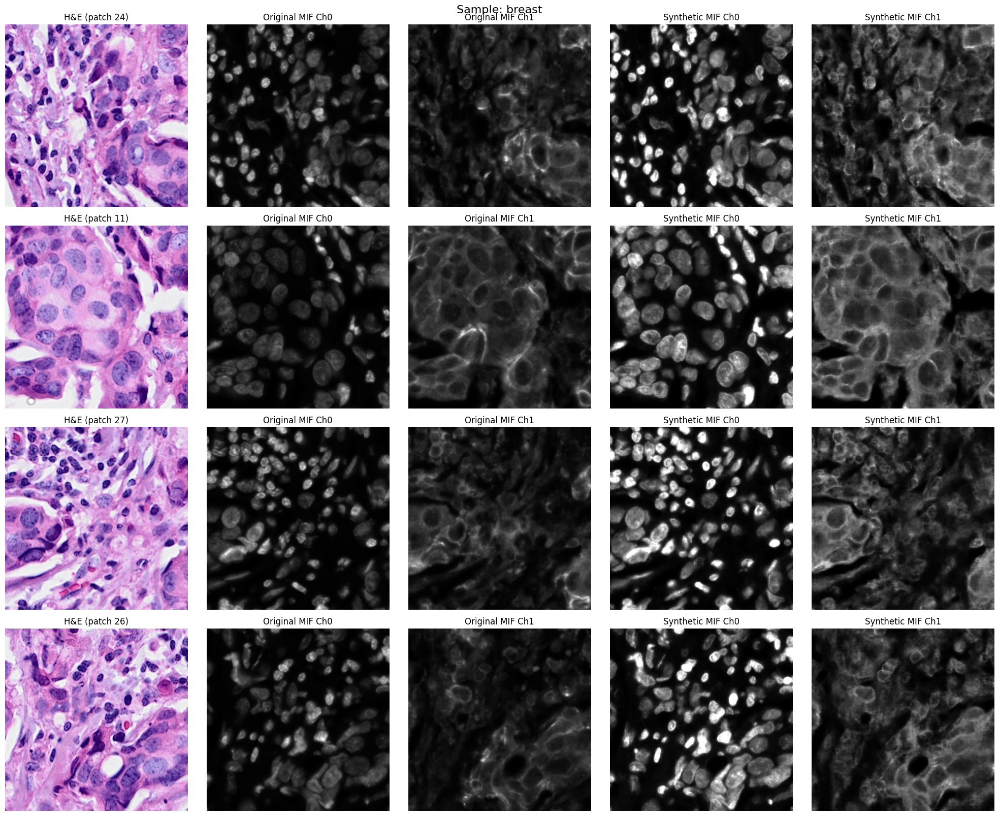

Original MIF shape: (145, 512, 512, 2)
Synthetic MIF shape: (145, 512, 512, 2)
Showing patches: [24, 11, 27, 26]


In [13]:
# Quick visualization: Compare Original vs Synthetic MIF
import zarr
import matplotlib.pyplot as plt
import numpy as np
import random

# Paths
sample_name = 'breast'  # or any other: 'cervical', 'lung', etc.
original_mif_path = f"/rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Xenium/zarr_data/{sample_name}/mif/images.zarr"
synthetic_mif_path = f"/rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Xenium_Syn/zarr_data/{sample_name}/mif/images.zarr"
he_path = f"/rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Xenium/zarr_data/{sample_name}/he/images.zarr"

# Load zarr arrays
original_mif = zarr.open(original_mif_path, 'r')
synthetic_mif = zarr.open(synthetic_mif_path, 'r')
he_img = zarr.open(he_path, 'r')

# Random patches
num_samples = 4
total_patches = original_mif.shape[0]
random_indices = random.sample(range(total_patches), num_samples)

# Plot
fig, axes = plt.subplots(num_samples, 5, figsize=(20, 4*num_samples))

for i, idx in enumerate(random_indices):
    # H&E
    axes[i, 0].imshow(he_img[idx])
    axes[i, 0].set_title(f'H&E (patch {idx})')
    axes[i, 0].axis('off')
    
    # Original MIF Ch0
    axes[i, 1].imshow(original_mif[idx, :, :, 0], cmap='gray')
    axes[i, 1].set_title('Original MIF Ch0')
    axes[i, 1].axis('off')
    
    # Original MIF Ch1
    axes[i, 2].imshow(original_mif[idx, :, :, 1], cmap='gray')
    axes[i, 2].set_title('Original MIF Ch1')
    axes[i, 2].axis('off')
    
    # Synthetic MIF Ch0
    axes[i, 3].imshow(synthetic_mif[idx, :, :, 0], cmap='gray')
    axes[i, 3].set_title('Synthetic MIF Ch0')
    axes[i, 3].axis('off')
    
    # Synthetic MIF Ch1
    axes[i, 4].imshow(synthetic_mif[idx, :, :, 1], cmap='gray')
    axes[i, 4].set_title('Synthetic MIF Ch1')
    axes[i, 4].axis('off')

plt.tight_layout()
plt.suptitle(f'Sample: {sample_name}', y=1.001, fontsize=16)
plt.show()

print(f"Original MIF shape: {original_mif.shape}")
print(f"Synthetic MIF shape: {synthetic_mif.shape}")
print(f"Showing patches: {random_indices}")

## New Datasets CRC mif

In [14]:
# ============================================================================
# Generate Synthetic MIF for CRC Samples
# Notebook script - Run cell by cell
# ============================================================================

# Cell 1: Imports and setup
import torch
import zarr
import numpy as np
from tqdm import tqdm
import os
import shutil
from pathlib import Path

from vitaminp.gan import Pix2PixGenerator
from vitaminp.gan.utils import GANPreprocessing

print("✅ Imports successful")

# Cell 2: Configuration
# Paths
CRC_ORIGINAL = "/rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC/zarr_data"
CRC_SYNTHETIC = "/rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data"
CHECKPOINT_PATH = "checkpoints/pix2pix_he_to_mif_final.pth"  # or best.pth

# CRC samples (41 samples)
CRC_SAMPLES = [
    'CRC01', 'CRC02', 'CRC03', 'CRC04', 'CRC05', 'CRC06', 'CRC07', 'CRC08', 'CRC09', 'CRC10',
    'CRC11', 'CRC12', 'CRC13', 'CRC14', 'CRC15', 'CRC16', 'CRC17', 'CRC18', 'CRC19', 'CRC20',
    'CRC21', 'CRC22', 'CRC23', 'CRC24', 'CRC25', 'CRC26', 'CRC27', 'CRC28', 'CRC29', 'CRC30',
    'CRC31', 'CRC32', 'CRC33_01', 'CRC33_02', 'CRC34', 'CRC35', 'CRC36', 'CRC37', 'CRC38', 
    'CRC39', 'CRC40'
]

print(f"Original path: {CRC_ORIGINAL}")
print(f"Synthetic output path: {CRC_SYNTHETIC}")
print(f"Samples to process: {len(CRC_SAMPLES)}")
print(f"Samples: {', '.join(CRC_SAMPLES)}")

# Cell 3: Load GAN generator
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Device: {device}")

generator = Pix2PixGenerator(in_channels=3, out_channels=2).to(device)
checkpoint = torch.load(CHECKPOINT_PATH, map_location=device)
generator.load_state_dict(checkpoint['generator_state_dict'])
generator.eval()

preprocessor = GANPreprocessing()

print(f"✅ Generator loaded from: {CHECKPOINT_PATH}")
print(f"   Model params: {sum(p.numel() for p in generator.parameters()):,}")

# Cell 4: Define generation function
@torch.no_grad()
def generate_synthetic_mif_for_sample(sample_name, batch_size=8):
    """Generate synthetic MIF for one CRC sample"""
    
    print(f"\n{'='*70}")
    print(f"Processing: {sample_name}")
    print(f"{'='*70}")
    
    # Paths
    original_he_zarr = os.path.join(CRC_ORIGINAL, sample_name, 'he', 'images.zarr')
    original_mif_dir = os.path.join(CRC_ORIGINAL, sample_name, 'mif')
    
    synthetic_sample_dir = os.path.join(CRC_SYNTHETIC, sample_name)
    synthetic_he_dir = os.path.join(synthetic_sample_dir, 'he')
    synthetic_mif_dir = os.path.join(synthetic_sample_dir, 'mif')
    
    # Check if original exists
    if not os.path.exists(original_he_zarr):
        print(f"⚠️  SKIP: {sample_name} not found in original data")
        return False
    
    # Create output directories
    os.makedirs(synthetic_he_dir, exist_ok=True)
    os.makedirs(synthetic_mif_dir, exist_ok=True)
    
    # Load original H&E zarr
    he_zarr = zarr.open(original_he_zarr, 'r')
    num_patches = he_zarr.shape[0]
    
    print(f"✓ Found {num_patches} patches")
    
    # Create synthetic MIF zarr (same shape as original but will have synthetic data)
    synthetic_mif_zarr = zarr.open(
        os.path.join(synthetic_mif_dir, 'images.zarr'),
        mode='w',
        shape=(num_patches, 512, 512, 2),
        chunks=(1, 512, 512, 2),
        dtype='uint16',  # Keep same dtype as original MIF
        compressor=zarr.Blosc(cname='zstd', clevel=3)
    )
    
    print(f"✓ Created synthetic MIF zarr: {synthetic_mif_zarr.shape}")
    
    # Generate synthetic MIF patch by patch (batched)
    print(f"\n🎨 Generating synthetic MIF...")
    
    for start_idx in tqdm(range(0, num_patches, batch_size), desc=f"{sample_name}"):
        end_idx = min(start_idx + batch_size, num_patches)
        
        # Load H&E batch
        he_batch = he_zarr[start_idx:end_idx]  # (B, 512, 512, 3)
        
        # Convert to torch tensor
        he_batch = torch.from_numpy(he_batch).float()  # (B, 512, 512, 3)
        he_batch = he_batch.permute(0, 3, 1, 2)  # (B, 3, 512, 512)
        he_batch = he_batch.to(device)
        
        # Normalize to [0, 1]
        he_batch = he_batch / 255.0
        
        # Preprocess for GAN
        he_batch = preprocessor.percentile_normalize(he_batch)
        he_batch = preprocessor.to_gan_range(he_batch)  # [-1, 1]
        
        # Generate synthetic MIF
        fake_mif = generator(he_batch)  # (B, 2, 512, 512) in [-1, 1]
        
        # Convert back to [0, 1]
        fake_mif = preprocessor.from_gan_range(fake_mif)
        
        # Convert to uint16 (scale to 0-65535 range like original MIF)
        fake_mif = (fake_mif * 65535).clamp(0, 65535)
        fake_mif = fake_mif.cpu().numpy().astype(np.uint16)
        
        # Transpose to (B, H, W, C)
        fake_mif = np.transpose(fake_mif, (0, 2, 3, 1))
        
        # Save to zarr
        synthetic_mif_zarr[start_idx:end_idx] = fake_mif
    
    print(f"✅ Synthetic MIF generated: {synthetic_mif_zarr.shape}")
    
    # Copy all other files unchanged (masks, metadata)
    print(f"\n📋 Copying masks and metadata...")
    
    # Copy H&E directory (images + masks + metadata)
    original_he_dir = os.path.join(CRC_ORIGINAL, sample_name, 'he')
    for item in os.listdir(original_he_dir):
        src = os.path.join(original_he_dir, item)
        dst = os.path.join(synthetic_he_dir, item)
        if os.path.isfile(src):
            shutil.copy2(src, dst)
        elif os.path.isdir(src):
            if os.path.exists(dst):
                shutil.rmtree(dst)
            shutil.copytree(src, dst)
    
    # Copy MIF masks and metadata (NOT images.zarr)
    for item in os.listdir(original_mif_dir):
        if item != 'images.zarr':  # Skip original MIF images
            src = os.path.join(original_mif_dir, item)
            dst = os.path.join(synthetic_mif_dir, item)
            if os.path.isfile(src):
                shutil.copy2(src, dst)
            elif os.path.isdir(src):
                if os.path.exists(dst):
                    shutil.rmtree(dst)
                shutil.copytree(src, dst)
    
    print(f"✅ Copied all masks and metadata")
    print(f"\n✅ {sample_name} complete!")
    print(f"   Output: {synthetic_sample_dir}")
    
    return True

# Cell 5: Process all CRC samples
print("\n" + "="*70)
print("GENERATING SYNTHETIC MIF FOR ALL CRC SAMPLES")
print("="*70)

success_count = 0
failed_samples = []

for sample_name in CRC_SAMPLES:
    try:
        success = generate_synthetic_mif_for_sample(sample_name, batch_size=8)
        if success:
            success_count += 1
        else:
            failed_samples.append(sample_name)
    except Exception as e:
        print(f"\n❌ ERROR processing {sample_name}: {str(e)}")
        import traceback
        traceback.print_exc()
        failed_samples.append(sample_name)

# Cell 6: Summary
print("\n" + "="*70)
print("FINAL SUMMARY")
print("="*70)
print(f"\n✅ Successfully processed: {success_count}/{len(CRC_SAMPLES)} samples")

if failed_samples:
    print(f"\n⚠️  Failed samples ({len(failed_samples)}):")
    for sample in failed_samples:
        print(f"  - {sample}")

print(f"\n✅ All synthetic MIF saved to: {CRC_SYNTHETIC}")
print("\n" + "="*70)
print("DONE!")
print("="*70)

✅ Imports successful
Original path: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC/zarr_data
Synthetic output path: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data
Samples to process: 41
Samples: CRC01, CRC02, CRC03, CRC04, CRC05, CRC06, CRC07, CRC08, CRC09, CRC10, CRC11, CRC12, CRC13, CRC14, CRC15, CRC16, CRC17, CRC18, CRC19, CRC20, CRC21, CRC22, CRC23, CRC24, CRC25, CRC26, CRC27, CRC28, CRC29, CRC30, CRC31, CRC32, CRC33_01, CRC33_02, CRC34, CRC35, CRC36, CRC37, CRC38, CRC39, CRC40
Device: cuda
✅ Generator loaded from: checkpoints/pix2pix_he_to_mif_final.pth
   Model params: 54,411,906

GENERATING SYNTHETIC MIF FOR ALL CRC SAMPLES

Processing: CRC01
✓ Found 36 patches
✓ Created synthetic MIF zarr: (36, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC01: 100%|██████████| 5/5 [00:01<00:00,  3.02it/s]


✅ Synthetic MIF generated: (36, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC01 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC01

Processing: CRC02
✓ Found 75 patches
✓ Created synthetic MIF zarr: (75, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC02: 100%|██████████| 10/10 [00:06<00:00,  1.56it/s]


✅ Synthetic MIF generated: (75, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC02 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC02

Processing: CRC03
✓ Found 43 patches
✓ Created synthetic MIF zarr: (43, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC03: 100%|██████████| 6/6 [00:02<00:00,  2.52it/s]


✅ Synthetic MIF generated: (43, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC03 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC03

Processing: CRC04
✓ Found 118 patches
✓ Created synthetic MIF zarr: (118, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC04: 100%|██████████| 15/15 [00:05<00:00,  2.57it/s]


✅ Synthetic MIF generated: (118, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC04 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC04

Processing: CRC05
✓ Found 696 patches
✓ Created synthetic MIF zarr: (696, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC05: 100%|██████████| 87/87 [00:34<00:00,  2.51it/s]


✅ Synthetic MIF generated: (696, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC05 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC05

Processing: CRC06
✓ Found 147 patches
✓ Created synthetic MIF zarr: (147, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC06: 100%|██████████| 19/19 [00:07<00:00,  2.58it/s]


✅ Synthetic MIF generated: (147, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC06 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC06

Processing: CRC07
✓ Found 130 patches
✓ Created synthetic MIF zarr: (130, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC07: 100%|██████████| 17/17 [00:06<00:00,  2.45it/s]


✅ Synthetic MIF generated: (130, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC07 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC07

Processing: CRC08
✓ Found 115 patches
✓ Created synthetic MIF zarr: (115, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC08: 100%|██████████| 15/15 [00:06<00:00,  2.48it/s]


✅ Synthetic MIF generated: (115, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC08 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC08

Processing: CRC09
✓ Found 57 patches
✓ Created synthetic MIF zarr: (57, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC09: 100%|██████████| 8/8 [00:03<00:00,  2.47it/s]


✅ Synthetic MIF generated: (57, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC09 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC09

Processing: CRC10
✓ Found 27 patches
✓ Created synthetic MIF zarr: (27, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC10: 100%|██████████| 4/4 [00:01<00:00,  3.21it/s]


✅ Synthetic MIF generated: (27, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC10 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC10

Processing: CRC11
✓ Found 13 patches
✓ Created synthetic MIF zarr: (13, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC11: 100%|██████████| 2/2 [00:00<00:00,  3.10it/s]


✅ Synthetic MIF generated: (13, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC11 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC11

Processing: CRC12
✓ Found 69 patches
✓ Created synthetic MIF zarr: (69, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC12: 100%|██████████| 9/9 [00:03<00:00,  2.33it/s]


✅ Synthetic MIF generated: (69, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC12 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC12

Processing: CRC13
✓ Found 38 patches
✓ Created synthetic MIF zarr: (38, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC13: 100%|██████████| 5/5 [00:02<00:00,  1.92it/s]


✅ Synthetic MIF generated: (38, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC13 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC13

Processing: CRC14
✓ Found 18 patches
✓ Created synthetic MIF zarr: (18, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC14: 100%|██████████| 3/3 [00:00<00:00,  3.20it/s]


✅ Synthetic MIF generated: (18, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC14 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC14

Processing: CRC15
✓ Found 18 patches
✓ Created synthetic MIF zarr: (18, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC15: 100%|██████████| 3/3 [00:01<00:00,  2.10it/s]


✅ Synthetic MIF generated: (18, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC15 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC15

Processing: CRC16
✓ Found 142 patches
✓ Created synthetic MIF zarr: (142, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC16: 100%|██████████| 18/18 [00:07<00:00,  2.51it/s]


✅ Synthetic MIF generated: (142, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC16 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC16

Processing: CRC17
✓ Found 76 patches
✓ Created synthetic MIF zarr: (76, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC17: 100%|██████████| 10/10 [00:03<00:00,  2.70it/s]


✅ Synthetic MIF generated: (76, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC17 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC17

Processing: CRC18
✓ Found 80 patches
✓ Created synthetic MIF zarr: (80, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC18: 100%|██████████| 10/10 [00:06<00:00,  1.64it/s]


✅ Synthetic MIF generated: (80, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC18 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC18

Processing: CRC19
✓ Found 29 patches
✓ Created synthetic MIF zarr: (29, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC19: 100%|██████████| 4/4 [00:01<00:00,  2.87it/s]


✅ Synthetic MIF generated: (29, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC19 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC19

Processing: CRC20
✓ Found 35 patches
✓ Created synthetic MIF zarr: (35, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC20: 100%|██████████| 5/5 [00:01<00:00,  2.84it/s]


✅ Synthetic MIF generated: (35, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC20 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC20

Processing: CRC21
✓ Found 20 patches
✓ Created synthetic MIF zarr: (20, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC21: 100%|██████████| 3/3 [00:01<00:00,  2.94it/s]


✅ Synthetic MIF generated: (20, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC21 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC21

Processing: CRC22
✓ Found 65 patches
✓ Created synthetic MIF zarr: (65, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC22: 100%|██████████| 9/9 [00:03<00:00,  2.88it/s]


✅ Synthetic MIF generated: (65, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC22 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC22

Processing: CRC23
✓ Found 51 patches
✓ Created synthetic MIF zarr: (51, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC23: 100%|██████████| 7/7 [00:02<00:00,  2.84it/s]


✅ Synthetic MIF generated: (51, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC23 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC23

Processing: CRC24
✓ Found 84 patches
✓ Created synthetic MIF zarr: (84, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC24: 100%|██████████| 11/11 [00:04<00:00,  2.38it/s]


✅ Synthetic MIF generated: (84, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC24 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC24

Processing: CRC25
✓ Found 24 patches
✓ Created synthetic MIF zarr: (24, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC25: 100%|██████████| 3/3 [00:01<00:00,  2.47it/s]


✅ Synthetic MIF generated: (24, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC25 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC25

Processing: CRC26
✓ Found 42 patches
✓ Created synthetic MIF zarr: (42, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC26: 100%|██████████| 6/6 [00:02<00:00,  2.78it/s]


✅ Synthetic MIF generated: (42, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC26 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC26

Processing: CRC27
✓ Found 29 patches
✓ Created synthetic MIF zarr: (29, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC27: 100%|██████████| 4/4 [00:01<00:00,  3.11it/s]


✅ Synthetic MIF generated: (29, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC27 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC27

Processing: CRC28
✓ Found 92 patches
✓ Created synthetic MIF zarr: (92, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC28: 100%|██████████| 12/12 [00:04<00:00,  2.81it/s]


✅ Synthetic MIF generated: (92, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC28 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC28

Processing: CRC29
✓ Found 53 patches
✓ Created synthetic MIF zarr: (53, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC29: 100%|██████████| 7/7 [00:02<00:00,  2.84it/s]


✅ Synthetic MIF generated: (53, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC29 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC29

Processing: CRC30
✓ Found 71 patches
✓ Created synthetic MIF zarr: (71, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC30: 100%|██████████| 9/9 [00:03<00:00,  2.31it/s]


✅ Synthetic MIF generated: (71, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC30 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC30

Processing: CRC31
✓ Found 149 patches
✓ Created synthetic MIF zarr: (149, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC31: 100%|██████████| 19/19 [00:07<00:00,  2.61it/s]


✅ Synthetic MIF generated: (149, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC31 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC31

Processing: CRC32
✓ Found 123 patches
✓ Created synthetic MIF zarr: (123, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC32: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s]


✅ Synthetic MIF generated: (123, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC32 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC32

Processing: CRC33_01
✓ Found 25 patches
✓ Created synthetic MIF zarr: (25, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC33_01: 100%|██████████| 4/4 [00:01<00:00,  3.06it/s]


✅ Synthetic MIF generated: (25, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC33_01 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC33_01

Processing: CRC33_02
✓ Found 52 patches
✓ Created synthetic MIF zarr: (52, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC33_02: 100%|██████████| 7/7 [00:02<00:00,  2.84it/s]


✅ Synthetic MIF generated: (52, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC33_02 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC33_02

Processing: CRC34
✓ Found 119 patches
✓ Created synthetic MIF zarr: (119, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC34: 100%|██████████| 15/15 [00:05<00:00,  2.55it/s]


✅ Synthetic MIF generated: (119, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC34 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC34

Processing: CRC35
✓ Found 54 patches
✓ Created synthetic MIF zarr: (54, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC35: 100%|██████████| 7/7 [00:02<00:00,  2.34it/s]


✅ Synthetic MIF generated: (54, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC35 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC35

Processing: CRC36
✓ Found 30 patches
✓ Created synthetic MIF zarr: (30, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC36: 100%|██████████| 4/4 [00:01<00:00,  2.72it/s]


✅ Synthetic MIF generated: (30, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC36 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC36

Processing: CRC37
✓ Found 63 patches
✓ Created synthetic MIF zarr: (63, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC37: 100%|██████████| 8/8 [00:02<00:00,  2.71it/s]


✅ Synthetic MIF generated: (63, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC37 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC37

Processing: CRC38
✓ Found 99 patches
✓ Created synthetic MIF zarr: (99, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC38: 100%|██████████| 13/13 [00:05<00:00,  2.53it/s]


✅ Synthetic MIF generated: (99, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC38 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC38

Processing: CRC39
✓ Found 62 patches
✓ Created synthetic MIF zarr: (62, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC39: 100%|██████████| 8/8 [00:03<00:00,  2.43it/s]


✅ Synthetic MIF generated: (62, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC39 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC39

Processing: CRC40
✓ Found 68 patches
✓ Created synthetic MIF zarr: (68, 512, 512, 2)

🎨 Generating synthetic MIF...


CRC40: 100%|██████████| 9/9 [00:03<00:00,  2.56it/s]


✅ Synthetic MIF generated: (68, 512, 512, 2)

📋 Copying masks and metadata...
✅ Copied all masks and metadata

✅ CRC40 complete!
   Output: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/CRC40

FINAL SUMMARY

✅ Successfully processed: 41/41 samples

✅ All synthetic MIF saved to: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data

DONE!


## Check

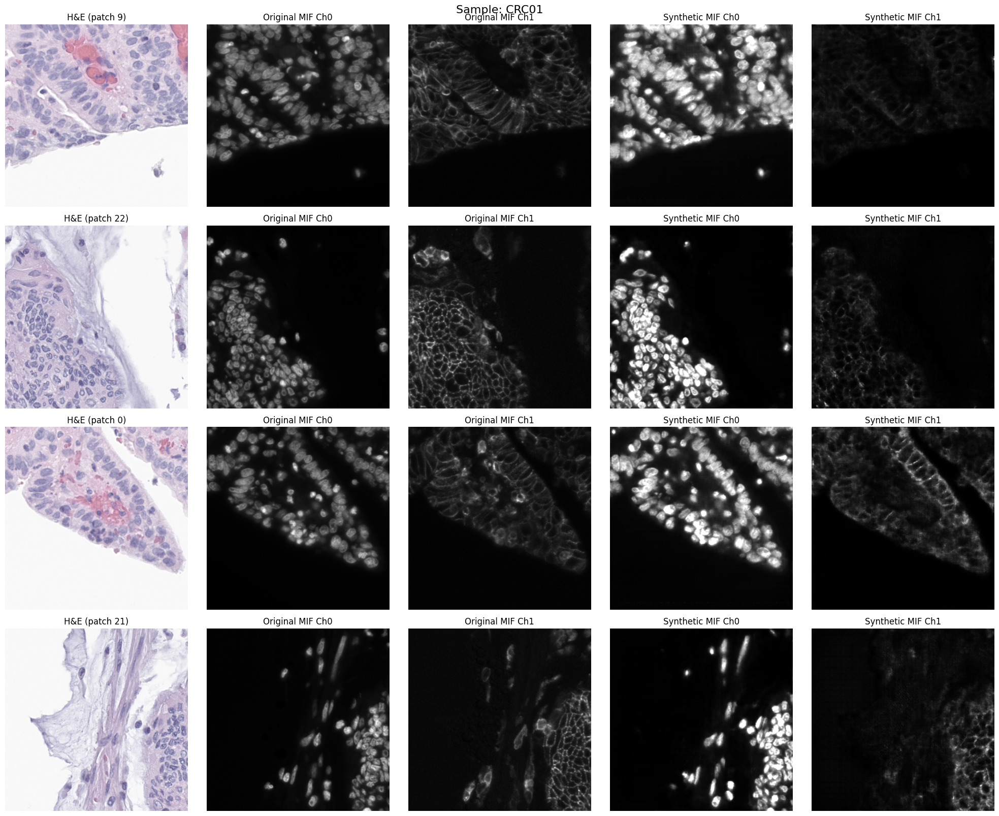

Original MIF shape: (36, 512, 512, 2)
Synthetic MIF shape: (36, 512, 512, 2)
Showing patches: [9, 22, 0, 21]


In [16]:
# Quick visualization: Compare Original vs Synthetic MIF (CRC)
import zarr
import matplotlib.pyplot as plt
import numpy as np
import random

# Paths
sample_name = 'CRC01'  # or any CRC: 'CRC02', 'CRC10', 'CRC33_01', etc.
original_mif_path = f"/rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC/zarr_data/{sample_name}/mif/images.zarr"
synthetic_mif_path = f"/rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC-Syn/zarr_data/{sample_name}/mif/images.zarr"
he_path = f"/rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC/zarr_data/{sample_name}/he/images.zarr"

# Load zarr arrays
original_mif = zarr.open(original_mif_path, 'r')
synthetic_mif = zarr.open(synthetic_mif_path, 'r')
he_img = zarr.open(he_path, 'r')

# Random patches
num_samples = 4
total_patches = original_mif.shape[0]
random_indices = random.sample(range(total_patches), num_samples)

# Plot
fig, axes = plt.subplots(num_samples, 5, figsize=(20, 4*num_samples))

for i, idx in enumerate(random_indices):
    # H&E
    axes[i, 0].imshow(he_img[idx])
    axes[i, 0].set_title(f'H&E (patch {idx})')
    axes[i, 0].axis('off')
    
    # Original MIF Ch0
    axes[i, 1].imshow(original_mif[idx, :, :, 0], cmap='gray')
    axes[i, 1].set_title('Original MIF Ch0')
    axes[i, 1].axis('off')
    
    # Original MIF Ch1
    axes[i, 2].imshow(original_mif[idx, :, :, 1], cmap='gray')
    axes[i, 2].set_title('Original MIF Ch1')
    axes[i, 2].axis('off')
    
    # Synthetic MIF Ch0
    axes[i, 3].imshow(synthetic_mif[idx, :, :, 0], cmap='gray')
    axes[i, 3].set_title('Synthetic MIF Ch0')
    axes[i, 3].axis('off')
    
    # Synthetic MIF Ch1
    axes[i, 4].imshow(synthetic_mif[idx, :, :, 1], cmap='gray')
    axes[i, 4].set_title('Synthetic MIF Ch1')
    axes[i, 4].axis('off')

plt.tight_layout()
plt.suptitle(f'Sample: {sample_name}', y=1.001, fontsize=16)
plt.show()

print(f"Original MIF shape: {original_mif.shape}")
print(f"Synthetic MIF shape: {synthetic_mif.shape}")
print(f"Showing patches: {random_indices}")